# Load Library

In [1]:
#!pip install -q git+https://github.com/huggingface/transformers.git

In [2]:
from transformers import Mask2FormerForUniversalSegmentation
import numpy as np
import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import os
from PIL import Image
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Data
---------

Data processing

In [3]:
from PIL import Image



METAINFO = {
    "classes": (
        "unlabelled",
        "asphalt",
        "dirt",
        "mud",
        "water",
        "gravel",
        "other-terrain",
        "tree-trunk",
        "tree-foliage",
        "bush",
        "fence",
        "structure",
        "pole",
        "vehicle",
        "rock",
        "log",
        "other-object",
        "sky",
        "grass",
    ),
    "palette": [
        (0, 0, 0),
        (230, 25, 75),
        (60, 180, 75),
        (255, 225, 25),
        (0, 130, 200),
        (145, 30, 180),
        (70, 240, 240),
        (240, 50, 230),
        (210, 245, 60),
        (230, 25, 75),
        (0, 128, 128),
        (170, 110, 40),
        (255, 250, 200),
        (128, 0, 0),
        (170, 255, 195),
        (128, 128, 0),
        (250, 190, 190),
        (0, 0, 128),
        (128, 128, 128),
    ],
        "cidx": [
            0,
            1,
            2,
            3,
            4,
            5,
            6,
            7,
            8,
            9,
            10,
            11,
            12,
            13,
            14,
            15,
            16,
            17,
            18
        ]
    }

def rgb_to_hex(r, g, b):
    return '#{:02x}{:02x}{:02x}'. format(int(r), int(g), int(b))


# METAINFO['cidx'] = list(range(len(METAINFO['palette'])))
METAINFO['hex'] = [rgb_to_hex(x[0],x[1],x[2]) for x in METAINFO['palette']]
METAINFO['hash'] = [str(x[0]) + str(x[1]) + str(x[2]) for x in METAINFO['palette']]
hex_2_class = {h:c for h,c in zip(METAINFO['hex'], METAINFO['classes'])}
hex_2_cidx = {h:cidx for h,cidx in zip(METAINFO['hex'], METAINFO['cidx'])}
class_2_hex = {c:h for h,c in hex_2_class.items()}
rgb_2_class = {p:c for p,c in zip(METAINFO['palette'], METAINFO['classes'])}
cidx_2_rgb = {cidx:p for cidx, p in zip(METAINFO['cidx'],METAINFO['palette'])}
cidx_2_class = {cidx:p for cidx, p in zip(METAINFO['cidx'], METAINFO['classes'])}
class_2_cidx = {c:cidx for c, cidx in zip(METAINFO['classes'], METAINFO['cidx'])}


hash_2_class = {h:c for h,c in zip(METAINFO['hash'], METAINFO['classes'])}
hash_2_cidx = {h:c for h,c in zip(METAINFO['hash'], METAINFO['cidx'])}
class_2_rgb = {c:p for c,p in zip(METAINFO['classes'], METAINFO['palette'])}


In [4]:
cidx_2_class

{0: 'unlabelled',
 1: 'asphalt',
 2: 'dirt',
 3: 'mud',
 4: 'water',
 5: 'gravel',
 6: 'other-terrain',
 7: 'tree-trunk',
 8: 'tree-foliage',
 9: 'bush',
 10: 'fence',
 11: 'structure',
 12: 'pole',
 13: 'vehicle',
 14: 'rock',
 15: 'log',
 16: 'other-object',
 17: 'sky',
 18: 'grass'}

In [5]:

class Image2DDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.samples = []

        # Walk through the directory structure
        for subdir, dirs, files in os.walk(root_dir):
            if '.ipynb_checkpoints' in dirs:
                dirs.remove('.ipynb_checkpoints')
            if 'image' in subdir:
                label_dir = subdir.replace('image', 'indexLabel')
                for file in files:
                    if file.endswith('.jpg') or file.endswith('.png'):
                        img_path = os.path.join(subdir, file)
                        label_path = os.path.join(label_dir, file)
                        if os.path.exists(label_path):  
                            self.samples.append((img_path, label_path))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label_path = self.samples[idx]
        
        original_image, original_segmentation_map = np.array(Image.open(img_path).convert('RGB')), np.array(Image.open(label_path))
        image = Image.open(img_path).resize((256, 256)).convert('RGB')
        label = Image.open(label_path).resize((256, 256), Image.NEAREST)
        label = np.array(label)
        image = np.array(image)/255

        return image, label, original_image, original_segmentation_map


In [6]:

train_dataset = Image2DDataset("train")
test_dataset = Image2DDataset("test")
val_dataset = Image2DDataset("val")


In [7]:
def color_palette():
    return [
        (0, 0, 0),
        (230, 25, 75),
        (60, 180, 75),
        (255, 225, 25),
        (0, 130, 200),
        (145, 30, 180),
        (70, 240, 240),
        (240, 50, 230),
        (210, 245, 60),
        (230, 25, 75),
        (0, 128, 128),
        (170, 110, 40),
        (255, 250, 200),
        (128, 0, 0),
        (170, 255, 195),
        (128, 128, 0),
        (250, 190, 190),
        (0, 0, 128),
        (128, 128, 128),
    ]

palette = color_palette()

##  View dataset
------
Check dataset if valid


In [8]:
image, label, _,_ = train_dataset[0]

In [9]:
np.unique(label)

array([ 2,  7,  8, 17, 18], dtype=uint8)

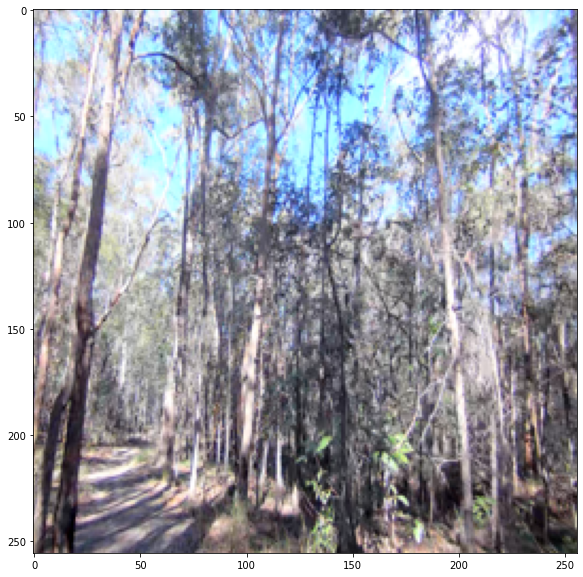

In [10]:
image = image*255
image = image.astype(np.uint8)
plt.figure(figsize=(15, 10))
plt.imshow(image)
plt.show()

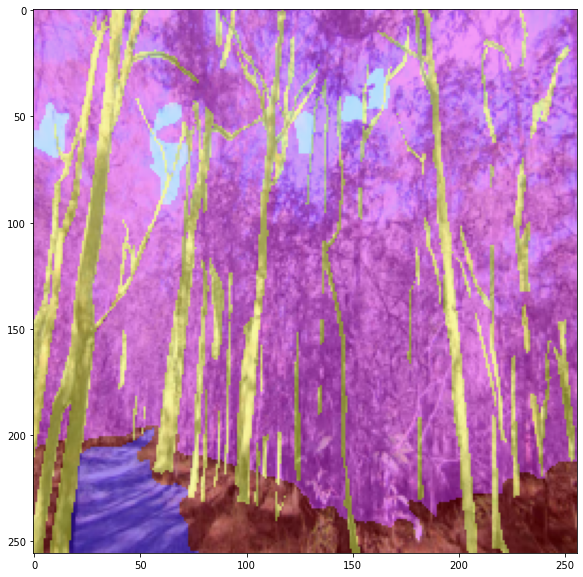

In [11]:
color_segmentation_map = np.zeros((label.shape[0], label.shape[1], 3), dtype=np.uint8) # height, width, 3
for l, c in enumerate(palette):
    color_segmentation_map[label - 1 == l, :] = c
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

## DataLoader
-------
Create pytorch dataloder

In [12]:
from transformers import MaskFormerImageProcessor

# Create a preprocessor
preprocessor = MaskFormerImageProcessor(ignore_index=0, do_reduce_labels=False, do_resize=False, do_rescale=False, do_normalize=False)


In [13]:
def collate_fn(batch):
    inputs = list(zip(*batch))
    images = inputs[0]
    segmentation_maps = inputs[1]
    batch = preprocessor(
        images,
        segmentation_maps=segmentation_maps,
        return_tensors="pt",
    )
    # batch['class_labels'] = [i.to(torch.float32) for i in batch['class_labels']]
    batch['pixel_values'] = batch['pixel_values'].to(torch.float32)
    batch["original_images"] = inputs[2]
    batch["original_segmentation_maps"] = inputs[3]
    return batch

train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=collate_fn, num_workers=12)
valid_dataloader = DataLoader(val_dataset, batch_size=8, shuffle=False, collate_fn=collate_fn, num_workers=12)
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=False, collate_fn=collate_fn, num_workers=12)

In [14]:
import torch

batch = next(iter(train_dataloader))
for k,v in batch.items():
    if isinstance(v, torch.Tensor):
        print(k,v.shape, v.dtype)
    else:
        print(k,v[0].shape, v[0].dtype)

pixel_values torch.Size([8, 3, 256, 256]) torch.float32
pixel_mask torch.Size([8, 256, 256]) torch.int64
mask_labels torch.Size([5, 256, 256]) torch.float32
class_labels torch.Size([5]) torch.int64
original_images (1512, 2016, 3) uint8
original_segmentation_maps (1512, 2016) uint8


In [15]:
pixel_values = batch["pixel_values"][0].numpy()
pixel_values.shape

(3, 256, 256)

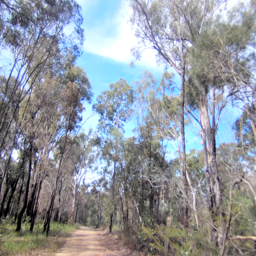

In [16]:
unnormalized_image = (pixel_values * 255).astype(np.uint8)
unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
Image.fromarray(unnormalized_image)

In [17]:
id2label = cidx_2_class.copy()

In [18]:
# verify class labels
labels = [id2label[label] for label in batch["class_labels"][0].tolist()]
print(labels)

['dirt', 'tree-trunk', 'tree-foliage', 'sky', 'grass']


In [19]:
# verify mask labels
batch["mask_labels"][0].shape

torch.Size([5, 256, 256])

In [20]:
def visualize_mask(labels, label_name):
    print("Label:", label_name)
    idx = labels.index(label_name)

    visual_mask = (batch["mask_labels"][0][idx].bool().numpy() * 255).astype(np.uint8)
    return Image.fromarray(visual_mask)

Label: dirt


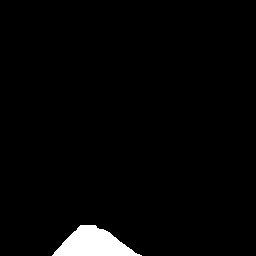

In [21]:
visualize_mask(labels, labels[0])

# Model
---------
Bulidinng mask2former model

In [22]:
model = Mask2FormerForUniversalSegmentation.from_pretrained(
    "mask2former-swin-small-coco-instance",
    id2label=id2label,
    ignore_mismatched_sizes=True
)

Some weights of Mask2FormerForUniversalSegmentation were not initialized from the model checkpoint at mask2former-swin-small-coco-instance and are newly initialized because the shapes did not match:
- class_predictor.bias: found shape torch.Size([81]) in the checkpoint and torch.Size([20]) in the model instantiated
- class_predictor.weight: found shape torch.Size([81, 256]) in the checkpoint and torch.Size([20, 256]) in the model instantiated
- criterion.empty_weight: found shape torch.Size([81]) in the checkpoint and torch.Size([20]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [23]:
outputs = model(batch["pixel_values"],
                class_labels=batch["class_labels"],
                mask_labels=batch["mask_labels"])

In [24]:
print(outputs.loss)

tensor(164.6290, grad_fn=<AddBackward0>)


In [25]:
# !pip install -q evaluate

# Train
--------
Train the mask2former model using our dataset

In [26]:

import evaluate

metric = evaluate.load("mean_iou")

In [27]:
import torch
from tqdm.auto import tqdm
import gc

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=5e-5)

running_loss = 0.0
num_samples = 0
for epoch in range(5):
    print("Epoch:", epoch)
    model.train()
    for idx, batch in enumerate(tqdm(train_dataloader)):
        # Reset the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(
          pixel_values=batch["pixel_values"].to(device),
          mask_labels=[labels.to(device) for labels in batch["mask_labels"]],
          class_labels=[labels.to(device) for labels in batch["class_labels"]],
        )

        # Backward propagation
        loss = outputs.loss
        loss.backward()

        batch_size = batch["pixel_values"].size(0)
        running_loss += loss.item()
        num_samples += batch_size

        if idx % 100 == 0:
            print("Loss:", running_loss/num_samples)

        # Optimization
        optimizer.step()
        
    torch.cuda.empty_cache()
    gc.collect()
    
    model.eval()
    for idx, batch in enumerate(tqdm(valid_dataloader)):
        # if idx > 5:
        #     break

        pixel_values = batch["pixel_values"]

        # Forward pass
        with torch.no_grad():
            outputs = model(pixel_values=pixel_values.to(device))

        # get original images
        original_images = batch["original_images"]
        target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
        # predict segmentation maps
        predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                      target_sizes=target_sizes)

        # get ground truth segmentation maps
        ground_truth_segmentation_maps = batch["original_segmentation_maps"]

        metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)
    
    # NOTE this metric outputs a dict that also includes the mIoU per category as keys
    # so if you're interested, feel free to print them as well
    print("Mean IoU:", metric.compute(num_labels = len(id2label),ignore_index=0)['mean_iou'])
    
    torch.cuda.empty_cache()
    gc.collect()
    

Epoch: 0


  0%|          | 0/226 [00:03<?, ?it/s]

Loss: 16.886886596679688
Loss: 9.363240270331355
Loss: 8.150302728017172


  0%|          | 0/11 [00:02<?, ?it/s]

/root/miniconda3/lib/python3.8/site-packages/datasets/features/image.py:348: UserWarning: Downcasting array dtype int64 to int32 to be compatible with 'Pillow'
  warnings.warn(f"Downcasting array dtype {dtype} to {dest_dtype} to be compatible with 'Pillow'")
/root/.cache/huggingface/modules/evaluate_modules/metrics/mean_iou/fd720fb772e7115ba8a8d8c77481457775a9f859e22093d6e5325d0ea844c892/mean_iou.py:259: RuntimeWarning: invalid value encountered in divide
  iou = total_area_intersect / total_area_union
/root/.cache/huggingface/modules/evaluate_modules/metrics/mean_iou/fd720fb772e7115ba8a8d8c77481457775a9f859e22093d6e5325d0ea844c892/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


Mean IoU: 0.366253901505381
Epoch: 1


  0%|          | 0/226 [00:02<?, ?it/s]

Loss: 7.947977255094419
Loss: 7.400965534583508
Loss: 7.044366948219317


  0%|          | 0/11 [00:02<?, ?it/s]

Mean IoU: 0.37549156063656464
Epoch: 2


  0%|          | 0/226 [00:02<?, ?it/s]

Loss: 6.967869845973472
Loss: 6.721355031239405
Loss: 6.518995533310801


  0%|          | 0/11 [00:02<?, ?it/s]

Mean IoU: 0.3815343227884747
Epoch: 3


  0%|          | 0/226 [00:02<?, ?it/s]

Loss: 6.478466413860293
Loss: 6.313533288370507
Loss: 6.183592741535521


  0%|          | 0/11 [00:02<?, ?it/s]

Mean IoU: 0.3931916796752024
Epoch: 4


  0%|          | 0/226 [00:02<?, ?it/s]

Loss: 6.154572316691362
Loss: 6.045366904984659
Loss: 5.950377513056966


  0%|          | 0/11 [00:02<?, ?it/s]

Mean IoU: 0.34962302611089824


# Inference
--------
Using trained model to inference image

In [28]:
batch = next(iter(test_dataloader))
for k,v in batch.items():
    if isinstance(v, torch.Tensor):
        print(k,v.shape)
    else:
        print(k,len(v))
     

pixel_values torch.Size([8, 3, 256, 256])
pixel_mask torch.Size([8, 256, 256])
mask_labels 8
class_labels 8
original_images 8
original_segmentation_maps 8


In [29]:
# forward pass
with torch.no_grad():
    outputs = model(batch["pixel_values"].to(device))

In [30]:
original_images = batch["original_images"]
target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
# predict segmentation maps
predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs, target_sizes=target_sizes)

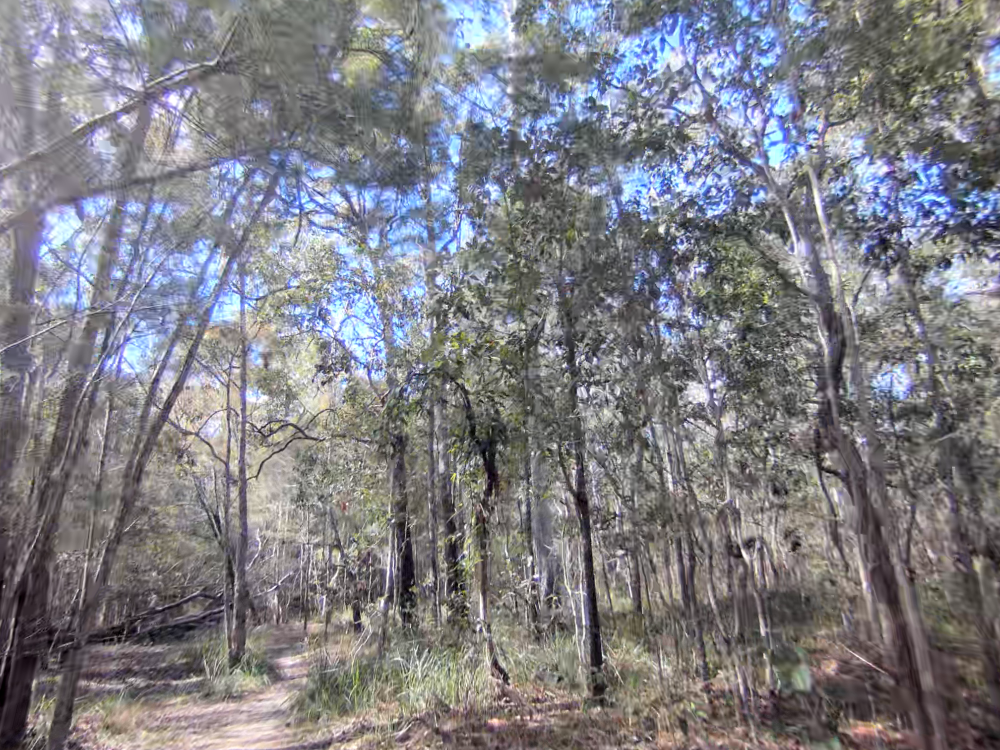

In [31]:
# original_images
image = batch["original_images"][0]
Image.fromarray(image)

## Predict
---------
The model predict mask according to the input image

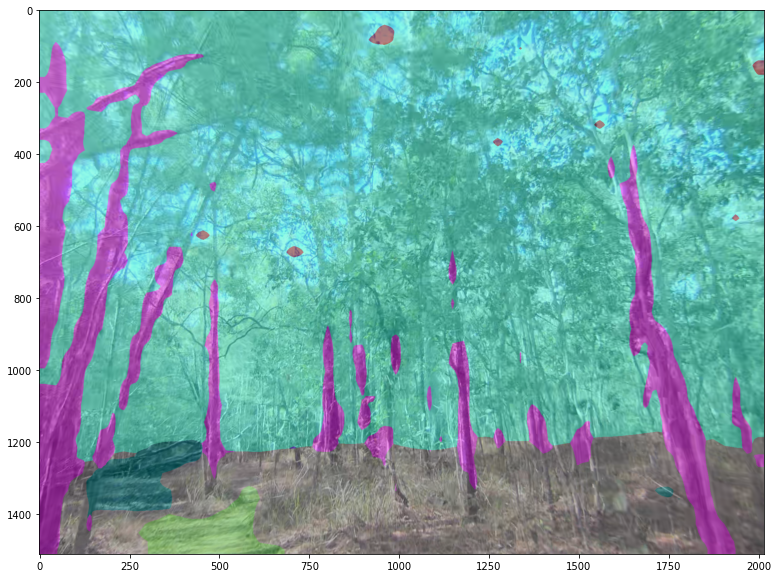

In [32]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = predicted_segmentation_maps[0].cpu().numpy()

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

## Truth

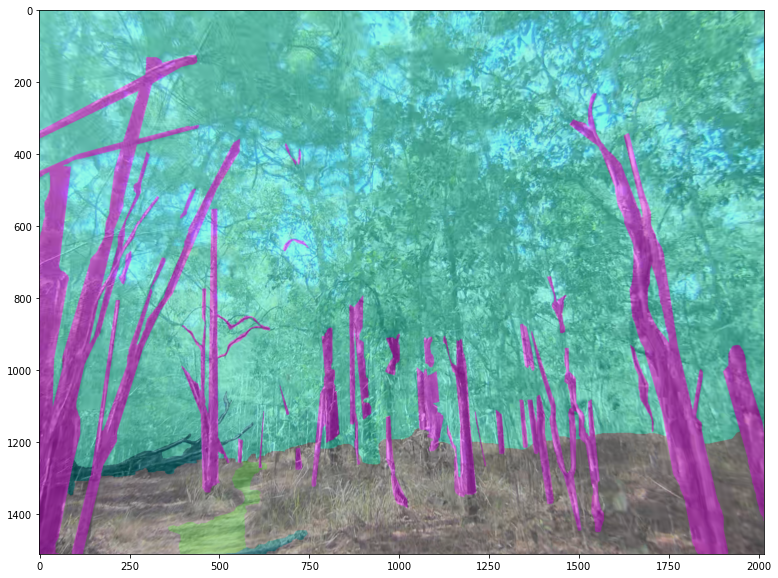

In [33]:
import numpy as np
import matplotlib.pyplot as plt

segmentation_map = batch["original_segmentation_maps"][0]

color_segmentation_map = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8) # height, width, 3
for label, color in enumerate(palette):
    color_segmentation_map[segmentation_map == label, :] = color
# Convert to BGR
ground_truth_color_seg = color_segmentation_map[..., ::-1]

img = image * 0.5 + ground_truth_color_seg * 0.5
img = img.astype(np.uint8)

plt.figure(figsize=(15, 10))
plt.imshow(img)
plt.show()

## Metric
--------
Compute the iou, precisionm, recall and accuary metric

In [35]:
metric = evaluate.load("mean_iou")

model.eval()
for idx, batch in enumerate(tqdm(test_dataloader)):

    pixel_values = batch["pixel_values"]

    # Forward pass
    with torch.no_grad():
        outputs = model(pixel_values=pixel_values.to(device))

    # get original images
    original_images = batch["original_images"]
    target_sizes = [(image.shape[0], image.shape[1]) for image in original_images]
    # predict segmentation maps
    predicted_segmentation_maps = preprocessor.post_process_semantic_segmentation(outputs,
                                                                                  target_sizes=target_sizes)

    # get ground truth segmentation maps
    ground_truth_segmentation_maps = batch["original_segmentation_maps"]

    metric.add_batch(references=ground_truth_segmentation_maps, predictions=predicted_segmentation_maps)

result = metric.compute(num_labels = len(id2label),ignore_index=0)

  0%|          | 0/80 [00:02<?, ?it/s]

In [36]:
result

{'mean_iou': 0.2679095614575891,
 'mean_accuracy': 0.3682274975465305,
 'overall_accuracy': 0.8139133137689942,
 'per_category_iou': array([       nan, 0.        , 0.71738198, 0.00214869, 0.45977107,
        0.        , 0.        , 0.48005537, 0.81558295, 0.20846755,
        0.        , 0.23104122, 0.        , 0.        , 0.        ,
        0.24053735, 0.3409995 , 0.76753025, 0.55885619]),
 'per_category_accuracy': array([       nan, 0.        , 0.82742986, 0.00214869, 0.81305909,
        0.        , 0.        , 0.59738867, 0.89166584, 0.50822564,
        0.        , 0.35126666, 0.        , 0.        , 0.        ,
        0.3641879 , 0.65801739, 0.83705405, 0.77765117])}

In [42]:
print('per_category_iou:')
for i in range(len(result['per_category_iou'])):
    print(f"{id2label[i]}:{result['per_category_iou'][i]}")

per_category_iou:
unlabelled:nan
asphalt:0.0
dirt:0.7173819755182624
mud:0.0021486882220795893
water:0.4597710664353913
gravel:0.0
other-terrain:0.0
tree-trunk:0.48005536918548936
tree-foliage:0.815582953021458
bush:0.20846754743385792
fence:0.0
structure:0.23104121659390772
pole:0.0
vehicle:0.0
rock:0.0
log:0.24053735296538892
other-object:0.34099949615675734
sky:0.7675302473824891
grass:0.5588561933215218


In [43]:
print('per_category_accuracy:')
for i in range(len(result['per_category_accuracy'])):
    print(f"{id2label[i]}:{result['per_category_accuracy'][i]}")

per_category_accuracy:
unlabelled:nan
asphalt:0.0
dirt:0.8274298619180781
mud:0.002148689119952597
water:0.8130590871107678
gravel:0.0
other-terrain:0.0
tree-trunk:0.5973886677065067
tree-foliage:0.8916658395037075
bush:0.5082256357168415
fence:0.0
structure:0.3512666585814369
pole:0.0
vehicle:0.0
rock:0.0
log:0.36418790081115043
other-object:0.6580173928871293
sky:0.8370540503892471
grass:0.7776511720927313
